# Influence Maximization
This notebook explores the <b>Greedy and CELF algorithms for influence maximization using the independent cascade method</b>. It will be implemented and compared using two different graph libraries: iGraph and NetworkX. For experimentation purposes, the following parameters will be fixed throughout this notebook:
1. p = probability of "infection"
2. k = how many nodes we want for our best seed set
3. n_iters = number of iterations for simulating the spread for independent cascade

In [1]:
# Import packages
import os, gc, pandas as pd, numpy as np, time, matplotlib.pyplot as plt, seaborn as sns, heapq, networkx as nx
# !pip install venny4py
from venny4py.venny4py import *
from random import uniform, seed
from igraph import *
from tqdm import tqdm
%matplotlib inline

In [2]:
# Fixed parameters
k = 50
prob = 0.2
n_iters=10 

# Data
The data to be used is a <b>directed graph</b> on emails in the EU. Source is as follows:
- Link:https://snap.stanford.edu/data/email-Eu-core.html
- Citation:
    - Hao Yin, Austin R. Benson, Jure Leskovec, and David F. Gleich. "Local Higher-order Graph Clustering." In Proceedings of the 23rd ACM SIGKDD International Conference on Knowledge Discovery and Data Mining. 2017.
    - J. Leskovec, J. Kleinberg and C. Faloutsos. Graph Evolution: Densification and Shrinking Diameters. ACM Transactions on Knowledge Discovery from Data (ACM TKDD), 1(1), 2007.


In [3]:
########### EMAIL DATASET
# https://snap.stanford.edu/data/email-Eu-core.html
# Source:
#     Hao Yin, Austin R. Benson, Jure Leskovec, and David F. Gleich. "Local Higher-order Graph Clustering." In Proceedings of the 23rd ACM SIGKDD International Conference on Knowledge Discovery and Data Mining. 2017.
#     J. Leskovec, J. Kleinberg and C. Faloutsos. Graph Evolution: Densification and Shrinking Diameters. ACM Transactions on Knowledge Discovery from Data (ACM TKDD), 1(1), 2007.

edges = pd.read_csv(r'data/email_eu/email-Eu-core.txt', sep=' ')
edges = edges.rename(columns={'0':'node_1', '1':'node_2'})

nvert = len(np.unique(edges.node_1.to_list()+edges.node_2.to_list()))
print(f'Number of vertices: {nvert}')
print(f'Number of edges: {len(edges)}')

truth = pd.read_csv('data/email_eu/email-Eu-core-department-labels.txt', sep=' ')
truth.columns=['node','label']
print('Total number of ground truth communities:',truth.label.nunique())
display(edges, truth)

Number of vertices: 1005
Number of edges: 25570
Total number of ground truth communities: 42


,node_1,node_2
0,2,3
1,2,4
2,5,6
3,5,7
4,8,9
...,...,...
25565,420,143
25566,174,859
25567,440,460
25568,52,786


,node,label
0,1,1
1,2,21
2,3,21
3,4,21
4,5,25
...,...,...
999,1000,4
1000,1001,21
1001,1002,1
1002,1003,6


# iGraph implementation
Based on: https://ethen8181.github.io/machine-learning/networkx/max_influence/max_influence.html

## Set-up graph

In [3]:
# create a directed graph
graph = Graph(directed=True)
graph.add_vertices(nvert)
graph.add_edges(edges.itertuples(index=False, name=None)) #zip(source,  target)
print('vertices count:',  graph.vcount())
print('edges count:',  graph.ecount())

vertices count: 1005
edges count: 25570


In [35]:
# Plot Graph
graph.es["color"], graph.vs["color"], graph.vs["label"] = "#B3CDE3", "#FBB4AE", ""
plot(graph, bbox = (300, 300),margin = 11,layout = graph.layout("kk"))

## Functions

In [15]:
def compute_independent_cascade(graph, seed_nodes, prob, n_iters):
    """
    Implements the Independent Cascade model to estimate the spread of a set of seed nodes given an infection probability.
    Arguments: 
        graph: (iGraph) directed graph to be analyzed
        seed_nodes: (list - int) list of seed nodes
        prob: (float) probability of infection
        n_iters: (int) number of iterations
        
    Returns: float, average expected spread across simulations
    """
    total_spead = 0

    # simulate the spread process over multiple runs
    for i in range(n_iters):
        np.random.seed(i)
        active = seed_nodes[:]
        new_active = seed_nodes[:]
        
        # for each newly activated nodes, find its neighbors that becomes activated
        while new_active:
            activated_nodes = []
            for node in new_active:
                neighbors = graph.neighbors(node, mode='out')
                success = np.random.uniform(0, 1, len(neighbors)) < prob
                activated_nodes += list(np.extract(success, neighbors))

            # ensure the newly activated nodes doesn't already exist
            # in the final list of activated nodes before adding them to the final list
            new_active = list(set(activated_nodes) - set(active))
            active += new_active

        total_spead += len(active)

    return total_spead / n_iters

def greedy(graph, k, prob=0.2, n_iters=10):
    """
    Find k nodes with the largest spread (determined by IC) from a igraph graph using the Greedy Algorithm.
    Arguments: 
        graph: (iGraph) directed graph to be analyzed
        k: (int) desired number of seed nodes 
        prob: (float) probability of infection. Defaults to 0.2.
        n_iters: (int) number of iterations. Defaults to 10
        
    Returns: a triple consisting of:
        solution: (list - int) k node indices of optimal seeds
        spreads: (list - float) spreads obtained after adding each node to the solution
        elapsed: (list - float) amount of time it took to get the solution every time a seed node is added to the solution. 
    """
    # Initialize
    elapsed = []
    spreads = []
    solution = []
    start_time = time.time()

    for _ in (range(k)):
        print(f"{_}/{k}")
        best_node = -1
        best_spread = -np.inf

        # loop over nodes that are not yet in our final solution
        # to find biggest marginal gain
        nodes = set(range(graph.vcount())) - set(solution)
        for node in tqdm(nodes):
            spread = compute_independent_cascade(graph, solution + [node], prob, n_iters)
            if spread > best_spread:
                best_spread = spread
                best_node = node

        solution.append(best_node)
        spreads.append(best_spread)

        elapse = round(time.time() - start_time, 3)
        elapsed.append(elapse)

    return solution, spreads, elapsed

def celf(graph, k, prob, n_iters):
    """
    Find k nodes with the largest spread (determined by IC) from a igraph graph
    using the Cost Effective Lazy Forward Algorithm, a.k.a Lazy Greedy Algorithm.
    Arguments: 
        graph: (iGraph) directed graph to be analyzed
        k: (int) desired number of seed nodes 
        prob: (float) probability of infection. Defaults to 0.2.
        n_iters: (int) number of iterations. Defaults to 10
        
    Returns: a triple consisting of:
        solution: (list - int) k node indices of optimal seeds
        spreads: (list - float) spreads obtained after adding each node to the solution
        elapsed: (list - float) amount of time it took to get the solution every time a seed node is added to the solution. 
        lookups: (list - int) number of times the spread is computed
    """
    start_time = time.time()

    # find the first node with greedy algorithm:
    # python's heap is a min-heap, thus
    # we negate the spread to get the node
    # with the maximum spread when popping from the heap
    gains = []
    for node in range(graph.vcount()):
        spread = compute_independent_cascade(graph, [node], prob, n_iters)
        heapq.heappush(gains, (-spread, node))

    # we pop the heap to get the node with the best spread,
    # when storing the spread to negate it again to store the actual spread
    spread, node = heapq.heappop(gains)
    solution = [node]
    spread = -spread
    spreads = [spread]

    # record the number of times the spread is computed
    lookups = [graph.vcount()]
    elapsed = [round(time.time() - start_time, 3)]

    for _ in (range(k - 1)):
        print(f"{_}/{k-1}")
        node_lookup = 0
        matched = False

        while not matched:
            node_lookup += 1000

            # here we need to compute the marginal gain of adding the current node
            # to the solution, instead of just the gain, i.e. we need to subtract
            # the spread without adding the current node
            _, current_node = heapq.heappop(gains)
            spread_gain = compute_independent_cascade(
                graph, solution + [current_node], prob, n_iters) - spread

            # check if the previous top node stayed on the top after pushing
            # the marginal gain to the heap
            heapq.heappush(gains, (-spread_gain, current_node))
            matched = gains[0][1] == current_node

        # spread stores the cumulative spread
        spread_gain, node = heapq.heappop(gains)
        spread -= spread_gain
        solution.append(node)
        spreads.append(spread)
        lookups.append(node_lookup)

        elapse = round(time.time() - start_time, 3)
        elapsed.append(elapse)

    return solution, spreads, elapsed, lookups

## Implementation

In [22]:
%%time

print('GREEDY ALGORITHM')

greedy_df=pd.DataFrame(columns=['k','solution','spreads','elapsed'])

greedy_solution, greedy_spreads, greedy_elapsed = greedy(graph, k, prob, n_iters)
print('k',k)
print('solution: ', greedy_solution)
print('spreads: ', greedy_spreads)
print('elapsed: ', greedy_elapsed,'\n\n')
greedy_df=pd.DataFrame(zip([i+1 for i in range(k)],greedy_solution, greedy_spreads, greedy_elapsed),
                       columns=['k','solution','spreads','elapsed'])
greedy_df.to_csv(f'results/igraph_greedy_{k}.csv', index=False)

GREEDY ALGORITHM
0/50


100%|██████████████████████████████████████████████████████████████████████████████| 1005/1005 [01:57<00:00,  8.53it/s]


1/50


100%|██████████████████████████████████████████████████████████████████████████████| 1004/1004 [02:53<00:00,  5.79it/s]


2/50


100%|██████████████████████████████████████████████████████████████████████████████| 1003/1003 [02:43<00:00,  6.12it/s]


3/50


100%|██████████████████████████████████████████████████████████████████████████████| 1002/1002 [02:50<00:00,  5.87it/s]


4/50


100%|██████████████████████████████████████████████████████████████████████████████| 1001/1001 [03:01<00:00,  5.51it/s]


5/50


100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:57<00:00,  5.64it/s]


6/50


100%|████████████████████████████████████████████████████████████████████████████████| 999/999 [02:50<00:00,  5.85it/s]


7/50


100%|████████████████████████████████████████████████████████████████████████████████| 998/998 [02:54<00:00,  5.72it/s]


8/50


100%|████████████████████████████████████████████████████████████████████████████████| 997/997 [02:44<00:00,  6.07it/s]


9/50


100%|████████████████████████████████████████████████████████████████████████████████| 996/996 [02:43<00:00,  6.09it/s]


10/50


100%|████████████████████████████████████████████████████████████████████████████████| 995/995 [03:12<00:00,  5.18it/s]


11/50


100%|████████████████████████████████████████████████████████████████████████████████| 994/994 [03:04<00:00,  5.39it/s]


12/50


100%|████████████████████████████████████████████████████████████████████████████████| 993/993 [02:51<00:00,  5.80it/s]


13/50


100%|████████████████████████████████████████████████████████████████████████████████| 992/992 [02:47<00:00,  5.93it/s]


14/50


100%|████████████████████████████████████████████████████████████████████████████████| 991/991 [02:55<00:00,  5.65it/s]


15/50


100%|████████████████████████████████████████████████████████████████████████████████| 990/990 [03:08<00:00,  5.26it/s]


16/50


100%|████████████████████████████████████████████████████████████████████████████████| 989/989 [03:04<00:00,  5.37it/s]


17/50


100%|████████████████████████████████████████████████████████████████████████████████| 988/988 [03:22<00:00,  4.89it/s]


18/50


100%|████████████████████████████████████████████████████████████████████████████████| 987/987 [02:48<00:00,  5.87it/s]


19/50


100%|████████████████████████████████████████████████████████████████████████████████| 986/986 [03:04<00:00,  5.34it/s]


20/50


100%|████████████████████████████████████████████████████████████████████████████████| 985/985 [03:14<00:00,  5.06it/s]


21/50


100%|████████████████████████████████████████████████████████████████████████████████| 984/984 [03:26<00:00,  4.76it/s]


22/50


100%|████████████████████████████████████████████████████████████████████████████████| 983/983 [03:14<00:00,  5.05it/s]


23/50


100%|████████████████████████████████████████████████████████████████████████████████| 982/982 [03:22<00:00,  4.85it/s]


24/50


100%|████████████████████████████████████████████████████████████████████████████████| 981/981 [02:57<00:00,  5.53it/s]


25/50


100%|████████████████████████████████████████████████████████████████████████████████| 980/980 [02:44<00:00,  5.97it/s]


26/50


100%|████████████████████████████████████████████████████████████████████████████████| 979/979 [02:41<00:00,  6.06it/s]


27/50


100%|████████████████████████████████████████████████████████████████████████████████| 978/978 [02:40<00:00,  6.10it/s]


28/50


100%|████████████████████████████████████████████████████████████████████████████████| 977/977 [02:40<00:00,  6.07it/s]


29/50


100%|████████████████████████████████████████████████████████████████████████████████| 976/976 [02:41<00:00,  6.04it/s]


30/50


100%|████████████████████████████████████████████████████████████████████████████████| 975/975 [02:38<00:00,  6.14it/s]


31/50


100%|████████████████████████████████████████████████████████████████████████████████| 974/974 [02:39<00:00,  6.10it/s]


32/50


100%|████████████████████████████████████████████████████████████████████████████████| 973/973 [02:38<00:00,  6.16it/s]


33/50


100%|████████████████████████████████████████████████████████████████████████████████| 972/972 [02:37<00:00,  6.15it/s]


34/50


100%|████████████████████████████████████████████████████████████████████████████████| 971/971 [02:37<00:00,  6.16it/s]


35/50


100%|████████████████████████████████████████████████████████████████████████████████| 970/970 [02:37<00:00,  6.18it/s]


36/50


100%|████████████████████████████████████████████████████████████████████████████████| 969/969 [02:39<00:00,  6.08it/s]


37/50


100%|████████████████████████████████████████████████████████████████████████████████| 968/968 [02:37<00:00,  6.15it/s]


38/50


100%|████████████████████████████████████████████████████████████████████████████████| 967/967 [02:43<00:00,  5.92it/s]


39/50


100%|████████████████████████████████████████████████████████████████████████████████| 966/966 [02:38<00:00,  6.11it/s]


40/50


100%|████████████████████████████████████████████████████████████████████████████████| 965/965 [03:29<00:00,  4.60it/s]


41/50


100%|████████████████████████████████████████████████████████████████████████████████| 964/964 [02:47<00:00,  5.76it/s]


42/50


100%|████████████████████████████████████████████████████████████████████████████████| 963/963 [03:00<00:00,  5.34it/s]


43/50


100%|████████████████████████████████████████████████████████████████████████████████| 962/962 [02:48<00:00,  5.72it/s]


44/50


100%|████████████████████████████████████████████████████████████████████████████████| 961/961 [02:44<00:00,  5.83it/s]


45/50


100%|████████████████████████████████████████████████████████████████████████████████| 960/960 [02:44<00:00,  5.83it/s]


46/50


100%|████████████████████████████████████████████████████████████████████████████████| 959/959 [02:44<00:00,  5.82it/s]


47/50


100%|████████████████████████████████████████████████████████████████████████████████| 958/958 [02:45<00:00,  5.80it/s]


48/50


100%|████████████████████████████████████████████████████████████████████████████████| 957/957 [02:44<00:00,  5.80it/s]


49/50


100%|████████████████████████████████████████████████████████████████████████████████| 956/956 [02:47<00:00,  5.72it/s]

k 50
solution:  [486, 762, 417, 422, 449, 774, 564, 349, 894, 561, 915, 948, 960, 994, 595, 603, 701, 770, 795, 864, 871, 576, 578, 876, 897, 910, 503, 583, 622, 916, 626, 688, 761, 780, 787, 881, 680, 831, 946, 819, 613, 888, 965, 854, 436, 668, 834, 853, 899, 959]
spreads:  [796.2, 797.2, 797.9, 798.5, 799.5, 799.4, 799.8, 802.2, 803.2, 802.7, 803.7, 804.7, 805.7, 806.7, 807.6, 808.5, 809.4, 810.3, 811.2, 812.1, 813.0, 813.2, 814.1, 815.0, 815.9, 816.5, 816.2, 817.1, 818.0, 819.4, 820.3, 821.2, 822.1, 822.5, 823.4, 824.3, 824.6, 825.5, 826.4, 826.5, 824.5, 825.5, 826.5, 826.7, 827.6, 828.5, 829.4, 830.3, 831.2, 832.1]
elapsed:  [117.892, 291.274, 455.146, 625.776, 807.527, 984.751, 1155.398, 1329.736, 1494.094, 1657.659, 1849.863, 2034.175, 2205.429, 2372.7, 2548.203, 2736.288, 2920.624, 3122.79, 3291.031, 3475.748, 3670.425, 3877.068, 4071.766, 4274.335, 4451.628, 4615.904, 4777.457, 4937.865, 5098.749, 5260.39, 5419.119, 5578.721, 5736.785, 5894.765, 6052.41, 6209.445, 6368.925, 65

In [23]:
%%time
print('CELF ALGORITHM')
celf_df=pd.DataFrame(columns=['k','solution','spreads','elapsed','lookups'])

celf_solution, celf_spreads, celf_elapsed, celf_lookups = celf(graph, k, prob, n_iters)
print('k',k)
print('solution: ', celf_solution)
print('spreads: ', celf_spreads)
print('elapsed: ', celf_elapsed)
print('lookups: ', celf_lookups,'\n\n')

celf_df=pd.DataFrame(zip([i+1 for i in range(k)],celf_solution, celf_spreads, celf_elapsed, celf_lookups),
                       columns=['k','solution','spreads','elapsed','lookups'])
celf_df.to_csv(f'results/igraph_celf_{k}.csv', index=False)    

CELF ALGORITHM
0/49
1/49
2/49
3/49
4/49
5/49
6/49
7/49
8/49
9/49
10/49
11/49
12/49
13/49
14/49
15/49
16/49
17/49
18/49
19/49
20/49
21/49
22/49
23/49
24/49
25/49
26/49
27/49
28/49
29/49
30/49
31/49
32/49
33/49
34/49
35/49
36/49
37/49
38/49
39/49
40/49
41/49
42/49
43/49
44/49
45/49
46/49
47/49
48/49
k 50
solution:  [486, 762, 417, 449, 595, 626, 688, 775, 780, 871, 876, 916, 987, 583, 603, 657, 702, 761, 770, 787, 795, 830, 861, 888, 893, 895, 899, 910, 928, 973, 975, 1002, 1004, 50, 149, 398, 605, 677, 701, 864, 946, 948, 985, 998, 475, 561, 606, 680, 774, 794]
spreads:  [796.2, 797.2, 797.9, 795.0, 795.7, 797.6, 798.4, 799.4, 800.2, 801.1, 802.1, 803.0, 803.1, 804.0, 805.0, 805.7, 806.5, 807.4, 808.3, 809.0, 806.7, 807.5, 809.2, 810.4, 811.0, 810.3, 810.9, 811.8, 812.7, 813.5, 814.2, 815.0, 815.7, 814.9, 814.6, 814.1, 814.7, 815.6, 817.0, 817.8, 818.8, 819.7, 820.5, 821.1, 821.6, 822.3, 823.1, 824.0, 824.8, 825.4]
elapsed:  [108.811, 256.719, 275.644, 316.91, 317.082, 317.261, 317.437,

# Networkx implementation
Based on: https://github.com/AdnanRasad/Influence-Maximization-Analysis/tree/master/Kempe-Independent-Cascades-Model

## Set-up graph

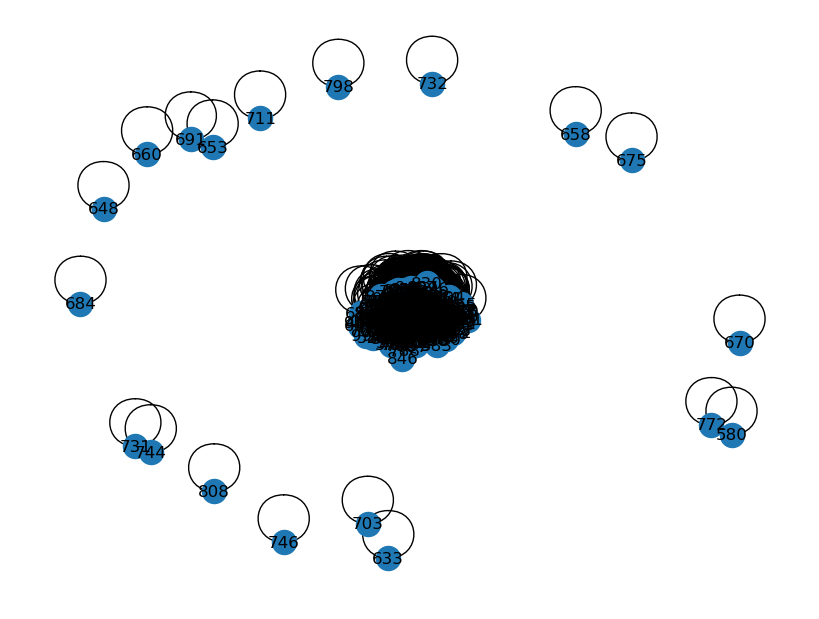

In [26]:
# Create graph
G = nx.from_pandas_edgelist(edges, 'node_1', 'node_2')

# Visualize the graph
nx.draw(G, with_labels=True)
plt.show()

## Functions

In [32]:
def IC(Networkx_Graph,Seed_Set,Probability,Num_of_Simulations):
    """
    Implements the Kempe Independent Cascade model to estimate the spread of a set of seed nodes given an infection probability.
    Arguments: 
        Networkx_Graph: (networkx graph) directed graph to be analyzed
        Seed_Set: (list - int) list of seed nodes
        Probability: (float) probability of infection
        Num_of_Simulations: (int) number of iterations
    Returns: float, average expected spread across simulations
    """
    
    spread = []
    for i in range(Num_of_Simulations):
        
        new_active, Ans = Seed_Set[:], Seed_Set[:]
        while new_active:
            #Getting neighbour nodes of newly activate node
            targets = Neighbour_finder(Networkx_Graph,new_active)
    
            #Calculating if any nodes of those neighbours can be activated, if yes add them to new_ones.
            np.random.seed(i)
            success = np.random.uniform(0,1,len(targets)) < Probability
            new_ones = list(np.extract(success, sorted(targets)))
            
            #Checking which ones in new_ones are not in our Ans...only adding them to our Ans so that no duplicate in Ans.
            new_active = list(set(new_ones) - set(Ans))
            Ans += new_active
            
        spread.append(len(Ans))
        
    return(np.mean(spread))
    
def Neighbour_finder(g,new_active):
    """
    Helper function to find neighbors of a node in graph g
    Arguments: 
        g: (networkx graph) directed graph to be analyzed
        new_active: (list - int) list of nodes
    Returns: (list - int) neighboring nodes of specified nodes
    """
    targets = []
    for node in new_active:
        targets += g.neighbors(node)

    return(targets)

def KempeGreedy(graph, num_seed_nodes, prob=0.2, n_iters=10):
    """
    Find k nodes with the largest spread (determined by IC) from a igraph graph using the Greedy Algorithm.
    Arguments: 
        graph: (networkx graph) directed graph to be analyzed
        num_seed_nodes: (int) desired number of seed nodes 
        prob: (float) probability of infection. Defaults to 0.2.
        n_iters: (int) number of iterations. Defaults to 10
        
    Returns: a triple consisting of:
        ultimate_seed_set: (list - int) k node indices of optimal seeds
        max_spreads: (list - float) spreads obtained after adding each node to the solution
        elapsed: (list - float) amount of time it took to get the solution every time a seed node is added to the solution. 

    """
    # Initialization
    max_spreads = []
    ultimate_seed_set = []
    elapsed=[]
    start_time = time.time()

    for _ in range(num_seed_nodes):
        print(f"{_}/{num_seed_nodes}")
        best_node = -1
        best_spread = -np.inf
        
        nods = graph.nodes - ultimate_seed_set;

        for node in tqdm(nods):
            each_infl  = IC(graph, ultimate_seed_set + [node], prob, n_iters)
            if each_infl  > best_spread:
                best_spread = each_infl 
                best_node = node

        ultimate_seed_set.append(best_node)
        max_spreads.append(best_spread)
        elapse = round(time.time() - start_time, 3)
        elapsed.append(elapse)
        
    return ultimate_seed_set, max_spreads, elapsed

def CELF(graph, k, prob, n_iters=10):
    """
    Find k nodes with the largest spread (determined by IC) from a igraph graph
    using the Cost Effective Lazy Forward Algorithm, a.k.a Lazy Greedy Algorithm.
    Arguments: 
        graph: (networkx graph) directed graph to be analyzed
        k: (int) desired number of seed nodes 
        prob: (float) probability of infection. Defaults to 0.2.
        n_iters: (int) number of iterations. Defaults to 10
        
    Returns: a triple consisting of:
        solution: (list - int) k node indices of optimal seeds
        spreads: (list - float) spreads obtained after adding each node to the solution
        elapsed: (list - float) amount of time it took to get the solution every time a seed node is added to the solution. 
        lookups: (list - int) number of times the spread is computed
    """
    start_time = time.time()

    # find the first node with greedy algorithm:
    # python's heap is a min-heap, thus
    # we negate the spread to get the node
    # with the maximum spread when popping from the heap
    gains = []
    for node in range(len(graph.nodes)):
        spread = IC(graph, [node], prob, n_iters)
        heapq.heappush(gains, (-spread, node))

    # we pop the heap to get the node with the best spread,
    # when storing the spread to negate it again to store the actual spread
    spread, node = heapq.heappop(gains)
    solution = [node]
    spread = -spread
    spreads = [spread]

    # record the number of times the spread is computed
    lookups = [len(graph.nodes)]
    elapsed = [round(time.time() - start_time, 3)]

    for _ in (range(k - 1)):
        print(f"{_}/{k-1}")
        node_lookup = 0
        matched = False

        while not matched:
            node_lookup += 1000

            # here we need to compute the marginal gain of adding the current node
            # to the solution, instead of just the gain, i.e. we need to subtract
            # the spread without adding the current node
            _, current_node = heapq.heappop(gains)
            spread_gain = IC(graph, solution + [current_node], prob, n_iters) - spread

            # check if the previous top node stayed on the top after pushing
            # the marginal gain to the heap
            heapq.heappush(gains, (-spread_gain, current_node))
            matched = gains[0][1] == current_node

        # spread stores the cumulative spread
        spread_gain, node = heapq.heappop(gains)
        spread -= spread_gain
        solution.append(node)
        spreads.append(spread)
        lookups.append(node_lookup)

        elapse = round(time.time() - start_time, 3)
        elapsed.append(elapse)

    return solution, spreads, elapsed, lookups

## Implementation

In [28]:
%%time

nx_greedy_df=pd.DataFrame(columns=['k','solution','spreads','elapsed'])

greedy_solution, greedy_spreads, greedy_elapsed = KempeGreedy(G, k, prob, n_iters)
print('k',k)
print('solution: ', greedy_solution)
print('spreads: ', greedy_spreads)
print('elapsed: ', greedy_elapsed,'\n\n')

nx_greedy_df=pd.DataFrame(zip([i+1 for i in range(k)],greedy_solution, greedy_spreads, greedy_elapsed),
                       columns=['k','solution','spreads','elapsed'])
nx_greedy_df.to_csv(f'results/nx_greedy_{k}.csv', index=False)    

0/50


100%|██████████████████████████████████████████████████████████████████████████████| 1005/1005 [01:11<00:00, 13.98it/s]


1/50


100%|██████████████████████████████████████████████████████████████████████████████| 1004/1004 [01:23<00:00, 12.01it/s]


2/50


100%|██████████████████████████████████████████████████████████████████████████████| 1003/1003 [01:21<00:00, 12.25it/s]


3/50


100%|██████████████████████████████████████████████████████████████████████████████| 1002/1002 [01:23<00:00, 12.04it/s]


4/50


100%|██████████████████████████████████████████████████████████████████████████████| 1001/1001 [01:26<00:00, 11.60it/s]


5/50


100%|██████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:23<00:00, 11.95it/s]


6/50


100%|████████████████████████████████████████████████████████████████████████████████| 999/999 [01:21<00:00, 12.28it/s]


7/50


100%|████████████████████████████████████████████████████████████████████████████████| 998/998 [01:21<00:00, 12.29it/s]


8/50


100%|████████████████████████████████████████████████████████████████████████████████| 997/997 [01:25<00:00, 11.70it/s]


9/50


100%|████████████████████████████████████████████████████████████████████████████████| 996/996 [01:21<00:00, 12.28it/s]


10/50


100%|████████████████████████████████████████████████████████████████████████████████| 995/995 [01:21<00:00, 12.28it/s]


11/50


100%|████████████████████████████████████████████████████████████████████████████████| 994/994 [01:21<00:00, 12.22it/s]


12/50


100%|████████████████████████████████████████████████████████████████████████████████| 993/993 [01:23<00:00, 11.92it/s]


13/50


100%|████████████████████████████████████████████████████████████████████████████████| 992/992 [01:20<00:00, 12.31it/s]


14/50


100%|████████████████████████████████████████████████████████████████████████████████| 991/991 [01:20<00:00, 12.24it/s]


15/50


100%|████████████████████████████████████████████████████████████████████████████████| 990/990 [01:20<00:00, 12.27it/s]


16/50


100%|████████████████████████████████████████████████████████████████████████████████| 989/989 [01:22<00:00, 12.04it/s]


17/50


100%|████████████████████████████████████████████████████████████████████████████████| 988/988 [01:20<00:00, 12.26it/s]


18/50


100%|████████████████████████████████████████████████████████████████████████████████| 987/987 [01:21<00:00, 12.18it/s]


19/50


100%|████████████████████████████████████████████████████████████████████████████████| 986/986 [01:22<00:00, 11.92it/s]


20/50


100%|████████████████████████████████████████████████████████████████████████████████| 985/985 [01:22<00:00, 11.96it/s]


21/50


100%|████████████████████████████████████████████████████████████████████████████████| 984/984 [01:22<00:00, 11.90it/s]


22/50


100%|████████████████████████████████████████████████████████████████████████████████| 983/983 [01:21<00:00, 12.03it/s]


23/50


100%|████████████████████████████████████████████████████████████████████████████████| 982/982 [01:23<00:00, 11.71it/s]


24/50


100%|████████████████████████████████████████████████████████████████████████████████| 981/981 [01:21<00:00, 12.08it/s]


25/50


100%|████████████████████████████████████████████████████████████████████████████████| 980/980 [01:21<00:00, 11.98it/s]


26/50


100%|████████████████████████████████████████████████████████████████████████████████| 979/979 [01:20<00:00, 12.11it/s]


27/50


100%|████████████████████████████████████████████████████████████████████████████████| 978/978 [01:23<00:00, 11.71it/s]


28/50


100%|████████████████████████████████████████████████████████████████████████████████| 977/977 [01:20<00:00, 12.11it/s]


29/50


100%|████████████████████████████████████████████████████████████████████████████████| 976/976 [01:21<00:00, 11.95it/s]


30/50


100%|████████████████████████████████████████████████████████████████████████████████| 975/975 [01:21<00:00, 11.96it/s]


31/50


100%|████████████████████████████████████████████████████████████████████████████████| 974/974 [01:22<00:00, 11.82it/s]


32/50


100%|████████████████████████████████████████████████████████████████████████████████| 973/973 [01:20<00:00, 12.04it/s]


33/50


100%|████████████████████████████████████████████████████████████████████████████████| 972/972 [01:21<00:00, 11.94it/s]


34/50


100%|████████████████████████████████████████████████████████████████████████████████| 971/971 [01:23<00:00, 11.63it/s]


35/50


100%|████████████████████████████████████████████████████████████████████████████████| 970/970 [01:21<00:00, 11.94it/s]


36/50


100%|████████████████████████████████████████████████████████████████████████████████| 969/969 [01:20<00:00, 11.98it/s]


37/50


100%|████████████████████████████████████████████████████████████████████████████████| 968/968 [01:21<00:00, 11.84it/s]


38/50


100%|████████████████████████████████████████████████████████████████████████████████| 967/967 [01:23<00:00, 11.64it/s]


39/50


100%|████████████████████████████████████████████████████████████████████████████████| 966/966 [01:19<00:00, 12.10it/s]


40/50


100%|████████████████████████████████████████████████████████████████████████████████| 965/965 [01:18<00:00, 12.22it/s]


41/50


100%|████████████████████████████████████████████████████████████████████████████████| 964/964 [01:19<00:00, 12.12it/s]


42/50


100%|████████████████████████████████████████████████████████████████████████████████| 963/963 [01:21<00:00, 11.86it/s]


43/50


100%|████████████████████████████████████████████████████████████████████████████████| 962/962 [01:19<00:00, 12.17it/s]


44/50


100%|████████████████████████████████████████████████████████████████████████████████| 961/961 [01:18<00:00, 12.23it/s]


45/50


100%|████████████████████████████████████████████████████████████████████████████████| 960/960 [01:20<00:00, 11.95it/s]


46/50


100%|████████████████████████████████████████████████████████████████████████████████| 959/959 [01:19<00:00, 12.00it/s]


47/50


100%|████████████████████████████████████████████████████████████████████████████████| 958/958 [01:18<00:00, 12.15it/s]


48/50


100%|████████████████████████████████████████████████████████████████████████████████| 957/957 [01:18<00:00, 12.19it/s]


49/50


100%|████████████████████████████████████████████████████████████████████████████████| 956/956 [01:20<00:00, 11.82it/s]

k 50
solution:  [573, 81, 975, 99, 973, 606, 281, 67, 119, 447, 568, 967, 628, 180, 370, 472, 338, 384, 246, 860, 283, 679, 704, 186, 2, 54, 91, 521, 369, 193, 580, 763, 540, 326, 51, 539, 597, 429, 986, 185, 342, 739, 256, 494, 25, 111, 727, 937, 301, 792]
spreads:  [827.2, 828.2, 830.1, 831.9, 831.9, 831.4, 830.3, 830.6, 830.5, 830.7, 831.5, 829.9, 830.6, 832.2, 831.3, 831.7, 833.0, 833.2, 832.1, 831.7, 831.6, 832.9, 832.9, 832.2, 831.7, 832.0, 831.0, 833.0, 832.2, 832.0, 832.0, 833.6, 834.2, 833.8, 834.0, 833.6, 834.3, 834.1, 835.0, 834.3, 834.6, 834.2, 835.9, 835.9, 834.8, 835.8, 836.5, 836.1, 835.7, 834.8]
elapsed:  [71.868, 155.458, 237.362, 320.61, 406.887, 490.56, 571.929, 653.156, 738.399, 819.542, 900.596, 981.911, 1065.188, 1145.799, 1226.79, 1307.508, 1389.68, 1470.27, 1551.321, 1634.032, 1716.409, 1799.116, 1880.812, 1964.66, 2045.873, 2127.652, 2208.469, 2291.958, 2372.613, 2454.279, 2535.793, 2618.194, 2699.046, 2780.48, 2863.998, 2945.247, 3026.108, 3107.897, 3190.99, 3

In [34]:
%%time

nx_greedy_df=pd.DataFrame(columns=['k','solution','spreads','elapsed'])

celf_solution, celf_spreads, celf_elapsed, celf_lookups = CELF(G, k, prob, n_iters)
print('k',k)
print('solution: ', celf_solution)
print('spreads: ', celf_spreads)
print('elapsed: ', celf_elapsed,'\n\n')

nx_celf_df=pd.DataFrame(zip([i+1 for i in range(k)], celf_solution, celf_spreads, celf_elapsed, celf_lookups),
                       columns=['k','solution','spreads','elapsed','lookups'])
nx_celf_df.to_csv(f'results/nx_celf_{k}.csv', index=False)

0/49
1/49
2/49
3/49
4/49
5/49
6/49
7/49
8/49
9/49
10/49
11/49
12/49
13/49
14/49
15/49
16/49
17/49
18/49
19/49
20/49
21/49
22/49
23/49
24/49
25/49
26/49
27/49
28/49
29/49
30/49
31/49
32/49
33/49
34/49
35/49
36/49
37/49
38/49
39/49
40/49
41/49
42/49
43/49
44/49
45/49
46/49
47/49
48/49
k 50
solution:  [573, 81, 965, 975, 973, 731, 732, 744, 746, 772, 168, 935, 1000, 40, 437, 846, 56, 229, 515, 522, 670, 791, 882, 70, 201, 260, 633, 637, 788, 88, 738, 887, 194, 466, 575, 605, 899, 527, 122, 327, 436, 534, 551, 944, 958, 966, 146, 206, 244, 293]
spreads:  [827.2, 828.2, 829.0, 829.7, 828.4, 827.5, 827.7, 831.2, 830.2, 834.8, 832.3, 829.8, 828.8, 830.5, 829.4, 828.0, 828.5, 826.6, 825.5, 828.8, 829.9, 828.2, 829.8, 829.7, 831.1, 829.9, 827.9, 833.2, 833.6, 842.4, 839.6, 837.1, 836.4, 835.2, 837.6, 836.0, 834.0, 836.6, 835.5, 838.7, 837.8, 839.4, 842.3, 840.6, 838.7, 837.3, 837.9, 841.6, 837.9, 837.7]
elapsed:  [67.044, 146.158, 148.269, 148.349, 149.149, 149.566, 149.645, 149.721, 149.804, 1

# Comparisons & Analysis
Please see cells below graphs for a short descriptions and analyses on the experiments conducted in this notebook

## Data and functions

In [6]:
# Read data
nx_celf=pd.read_csv('results/nx_celf_50.csv')
nx_greedy=pd.read_csv('results/nx_greedy_50.csv')
igraph_celf=pd.read_csv('results/igraph_celf_50.csv')
igraph_greedy=pd.read_csv('results/igraph_greedy_50.csv')

In [7]:
def compare_spread(greedy_spreads, celf_spreads):
    # change default style figure and font size
    plt.rcParams['figure.figsize'] = 8, 6
    plt.rcParams['font.size'] = 12

    lw = 4
    fig = plt.figure(figsize=(9,6))
    ax = fig.add_subplot(111)
    ax.plot(range(1, len(greedy_spreads) + 1), greedy_spreads, label="Greedy", color="#FBB4AE", lw=lw)
    ax.plot(range(1, len(celf_spreads) + 1), celf_spreads, label="CELF", color="#B3CDE3", lw=lw)
    ax.legend(loc=2)
    plt.ylabel('Expected Spread')
    plt.title('Expected Spread')
    plt.xlabel('Size of Seed Set')
    plt.tick_params(bottom=False, left=False)
    plt.show()
    
    # Get average difference
    diff=round(np.mean(np.abs(greedy_spreads-celf_spreads)), 2)
    mult=round(np.mean(greedy_spreads/celf_spreads),2)
    print(f"""Average absolute difference: {diff}""")
    print(f"""Average multiplicative factor: {mult}""")
    
def compare_time(greedy_elapsed, celf_elapsed):
    lw = 4
    fig = plt.figure(figsize=(9,6))
    ax = fig.add_subplot(111)
    ax.plot(range(1, len(greedy_elapsed) + 1), greedy_elapsed, label="Greedy", color="#FBB4AE", lw=lw)
    ax.plot(range(1, len(celf_elapsed) + 1), celf_elapsed, label="CELF", color="#B3CDE3", lw=lw)
    ax.legend(loc=2)
    plt.ylabel('Computation Time (Seconds)')
    plt.xlabel('Size of Seed Set')
    plt.title('Computation Time')
    plt.tick_params(bottom=False, left=False)
    plt.show()
    
    # Get average difference
    diff=round(np.mean(np.abs(greedy_elapsed-celf_elapsed)), 2)
    mult=round(np.mean(greedy_elapsed/celf_elapsed), 2)
    print(f"""Average absolute difference: {diff}""")
    print(f"""Average multiplicative factor: {mult}""")

## iGraph

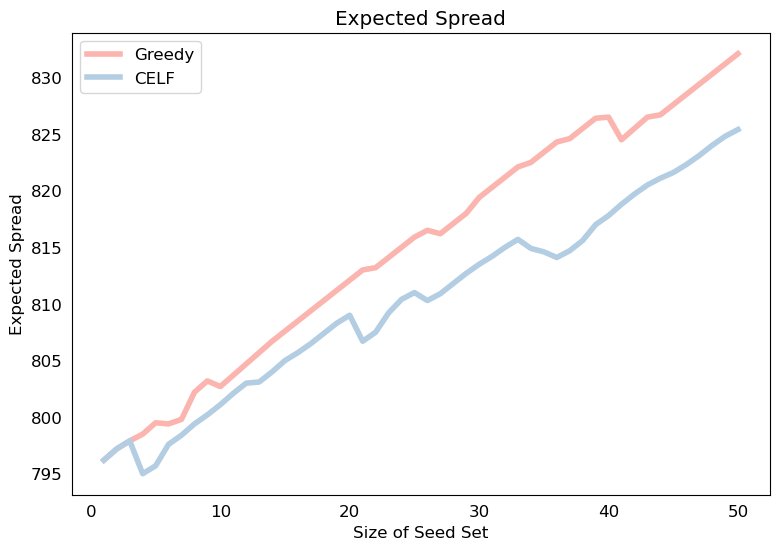

Average absolute difference: 4.85
Average multiplicative factor: 1.01


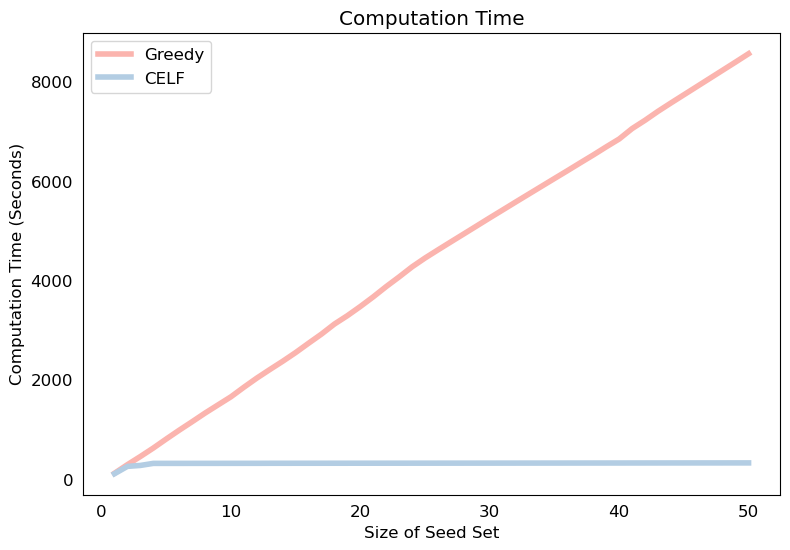

Average absolute difference: 4084.75
Average multiplicative factor: 13.64


In [8]:
compare_spread(igraph_greedy.spreads, igraph_celf.spreads)
compare_time(igraph_greedy.elapsed, igraph_celf.elapsed)

Greedy algorithm gets higher expected spreads as you increase the size of the seed set, with an average spread difference of 4.85. When looking at the computation time, it is evident that the CELF is must more efficient with Greedy taking as much as 13x longer on average. Given the slight difference in the expected spread and large advantage in terms of computation time, the CELF algorithm is highly recommended to solve the influence maximization problem.

## networkx

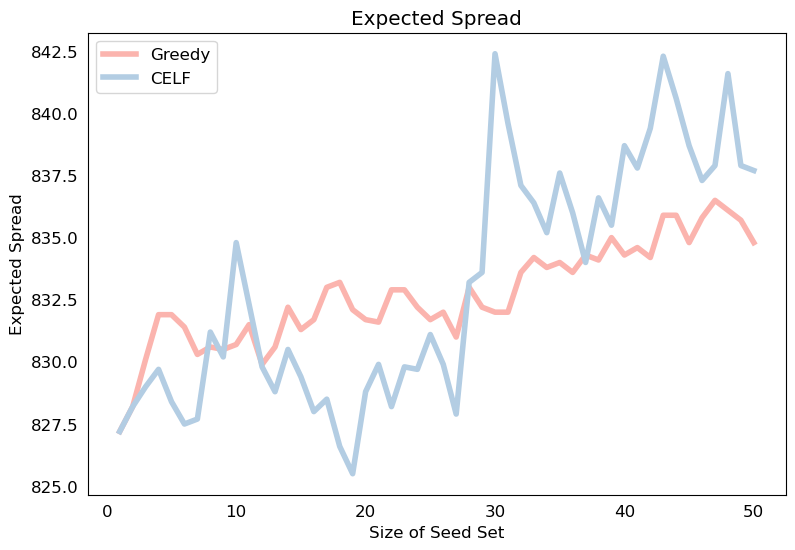

Average absolute difference: 2.88
Average multiplicative factor: 1.0


In [9]:
compare_spread(nx_greedy.spreads, nx_celf.spreads)

Unlike in the iGraph implementation, the Greedy algorithm isn't always better than CELF. It must be noted that Greedy produces better until around 28 then CELF proceeds to produce higher spreads afterward. Although it must also be noted that the expected spreads for CELF is rather erratic, compared to the stable incrase of the Greedy approach.

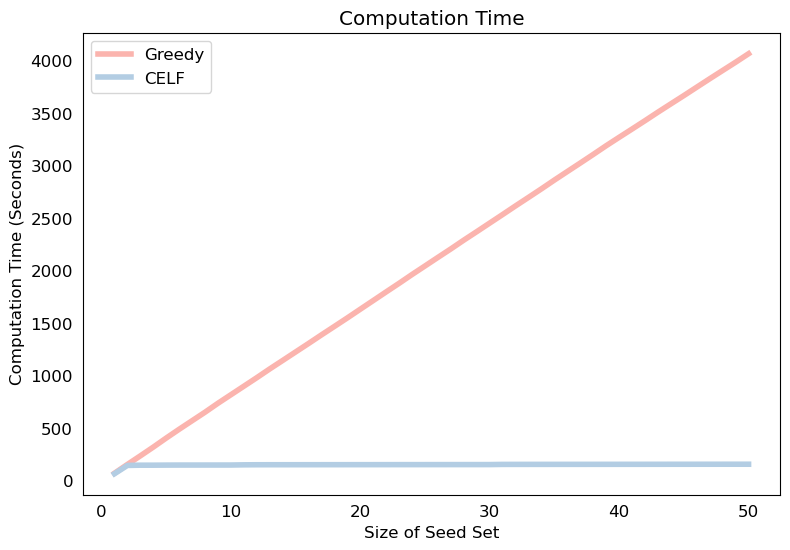

Average absolute difference: 1930.35
Average multiplicative factor: 13.42


In [10]:
compare_time(nx_greedy.elapsed, nx_celf.elapsed)

Very similar to the iGraph implementation, the CELF performs very well in terms of time, performing 13x faster than the greedy algorithm.

## Overall

In [29]:
# Compare solutions
check=pd.concat([igraph_greedy[['k','solution']], igraph_celf.solution, nx_greedy.solution, nx_celf.solution], axis=1)
check.columns = ['k','igraph_greedy', 'igraph_celf', 'networkx_greedy', 'networkx_celf']
check

,k,igraph_greedy,igraph_celf,networkx_greedy,networkx_celf
0,1,486,486,573,573
1,2,762,762,81,81
2,3,417,417,975,965
3,4,422,449,99,975
4,5,449,595,973,973
5,6,774,626,606,731
6,7,564,688,281,732
7,8,349,775,67,744
8,9,894,780,119,746
9,10,561,871,447,772


Looking at the solutions from the different approaches, it must be noted that within each the iGraph and NetworkX approaches, the initial seeds are similiar, up until the 2nd or 3rd seed. After which, the seeds are quite different, which can be visualized in the next graph below:

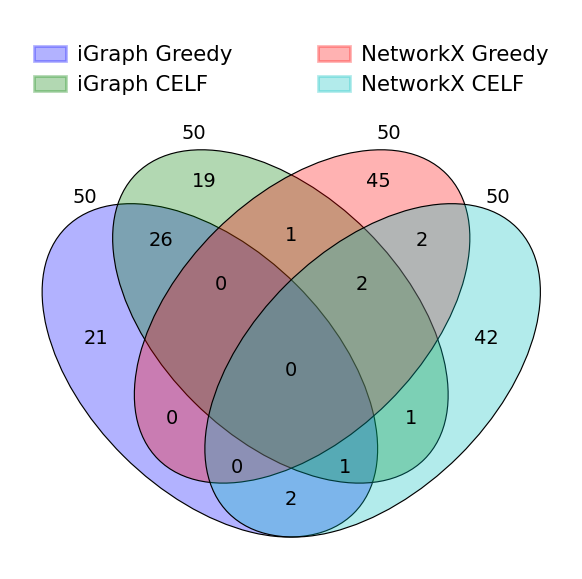

In [33]:
#dict of sets
sets = {'iGraph Greedy' : set(check.igraph_greedy),
        'iGraph CELF' : set(check.igraph_celf),
        'NetworkX Greedy' : set(check.networkx_greedy),
        'NetworkX CELF' : set(check.networkx_celf)}

venny4py(sets=sets)

The venn diagram above shows that the iGraph approaches have around half of the solution seed nodes in common while for the networkx implementation, there is barely any overlap in the two methods. Additionally, it must be noted that there is no node common among all four implementations.

In [35]:
for x in ['spreads','elapsed']:
    label={'spreads':'Expected Spread','elapsed':'Elapsed Time'}
    print(f'\nAverage {label[x]}:')
    display(pd.DataFrame(zip([igraph_celf[x].mean(), igraph_greedy[x].mean()],
                     [nx_celf[x].mean(), nx_greedy[x].mean()]),
                 columns=['iGraph', 'Networkx'], index=['CELF', 'Greedy']).round(2))


Average Expected Spread:


,iGraph,Networkx
CELF,810.23,833.11
Greedy,815.08,832.69



Average Elapsed Time:


,iGraph,Networkx
CELF,315.24,152.11
Greedy,4399.99,2082.47


With respect to the expected spreads, it can be seen that the networkx implementation seems to get higher values by around 20. Networkx also has the upper hand in terms of computation time, with it being only around half of the time needed for the iGraph implementation.

Overall, the NetworkX implementation using CELF is the highest performing implementation, achieving a good balance in maximizing spread and minimizing execution time. However, further studies must be done for even larger networks since it has also been said the iGraph should perform better for larger networks.